In [1]:
import sys
import os
import importlib
import random
from itertools import combinations

import numpy as np
import scipy

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns
import prettypyplot as pplt

import pyemma
import msmtools
import mdtraj as md

import ivac
import extq

In [2]:
sys.path.insert(1, "../../python")
sys.path.insert(1, "../../..")
import util
import plotting

In [3]:
plt.style.use("custom")  # custom style sheet
plt.style.use("muted")  # muted color theme from SciencePlots
colors = mpl.colors.to_rgba_array(
    [
        "#364B9A",
        "#4A7BB7",
        "#6EA6CD",
        "#98CAE1",
        "#C2E4EF",
        "#EAECCC",
        "#FEDA8B",
        "#FDB366",
        "#F67E4B",
        "#DD3D2D",
        "#A50026",
    ]
)
cm_div = mpl.colors.LinearSegmentedColormap.from_list("diverging", colors)
# color arrows from transparent to white depending on magnitude
rgb = 255 / 256
colors = [(rgb, rgb, rgb, c) for c in np.linspace(0.1, 1, 100)]
cmapwhite = mpl.colors.LinearSegmentedColormap.from_list("whites", colors)
rgb_black = 1 / 256
colors_black = [(rgb_black, rgb_black, rgb_black, c) for c in np.linspace(0.1, 1, 100)]
cmapblack = mpl.colors.LinearSegmentedColormap.from_list("blacks", colors_black)
mpl.colormaps.register(cm_div, force=True)
mpl.colormaps.register(cmapwhite, force=True)
mpl.colormaps.register(cmapblack, force=True)

In [4]:
pplt.load_cmaps()

# Load data

In [5]:
cv_trajs = list(
    np.load("../../data/raw_feat/cv_dist_spin_anton.npy", allow_pickle=True)
)
cv_trajs.extend(np.load("../../data/raw_feat/cv_dist_spin_anton2.npy"))
sb_trajs = list(np.load("../../data/raw_feat/feat2_raw_anton.npy", allow_pickle=True))
sb_trajs.extend(np.load("../../data/raw_feat/feat2_raw_anton2.npy"))

cv_arr = np.concatenate(cv_trajs)
sb_arr = np.concatenate(sb_trajs)

traj_inds = util.split_indices(cv_trajs)
print(cv_arr.shape, sb_arr.shape)

(4150115, 2) (4150115, 60)


In [6]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")
sb_models = np.load("../../data/models_centroids_feat2.npy")
sb_ids = [42, 48, 47, 53]

In [7]:
rf161 = list(np.load("../../data/raw_feat/rf161.npy", allow_pickle=True))
rf161.extend(np.load("../../data/raw_feat/rf161_anton2.npy"))
rf161_arr = np.concatenate(rf161)
print(rf161_arr.shape)

(4150115, 3)


In [8]:
hb_trajs = list(np.load("../../data/raw_feat/hbonds.npy", allow_pickle=True))
hb_trajs.extend(np.load("../../data/raw_feat/hbonds_anton2.npy", allow_pickle=True))
hb_arr = np.concatenate(hb_trajs)
print(hb_arr.shape)

(4150115, 18)


In [9]:
# load committors
qp_du = np.load("../../data/feat2_dist_du_anton2/qp_downup_3.npy", allow_pickle=True)[8] # 50 ns
qm_du = np.load("../../data/feat2_dist_du_anton2/qm_downup_3.npy", allow_pickle=True)[8]
qp_ud = np.load("../../data/feat2_dist_du_anton2/qp_updown_3.npy", allow_pickle=True)[8]
qm_ud = np.load("../../data/feat2_dist_du_anton2/qm_updown_3.npy", allow_pickle=True)[8]
weights = np.load("../../data/feat2_dist_du_anton2/weights_3_feat5ivac.npy", allow_pickle=True)

In [10]:
j_du_q = np.load("../../data/feat2_dist_du_anton2/j_du_q_3.npy", allow_pickle=True)[6] # 10 ns
j_ud_q = np.load("../../data/feat2_dist_du_anton2/j_ud_q_3.npy", allow_pickle=True)[6]
j_du_ds = np.load("../../data/feat2_dist_du_anton2/j_du_ds_3.npy", allow_pickle=True)[6]
j_du_sb = np.load("../../data/feat2_dist_du_anton2/j_du_sb_3.npy", allow_pickle=True)[6]

# conditional averages

In [239]:
dist_trajs = [t[:, 0] for t in cv_trajs]
rot_trajs = [t[:, 1] for t in cv_trajs]
xmin, xmax, ymin, ymax = -10, 10, -150, 100
xlim = np.linspace(xmin, xmax, 101)
ylim = np.linspace(ymin, ymax, 101)
step = 0.05
q_slices = [(i * step, (i + 1) * step) for i in range(int(np.ceil(1 / 0.05)))]
slice_ids = []
slice_dens = []
q_arr = np.concatenate(qp_du)
w_arr = np.concatenate(weights[0])
for low, hi in q_slices:
    inds = ((q_arr >= low) & (q_arr <= hi)).nonzero()[0]
    slice_ids.append(inds)
    dens, _, _ = np.histogram2d(
        cv_arr[inds, 0], 
        cv_arr[inds, 1], 
        range=[[xmin, xmax], [ymin, ymax]],
        weights=w_arr[inds],
        density=True,
        bins=100)
    slice_dens.append(dens)
pmf = extq.projection.density2d(dist_trajs, rot_trajs, weights[0], xlim, ylim)
xcent = (xlim[1:] + xlim[:-1]) / 2
ycent = (ylim[1:] + ylim[:-1]) / 2
offset = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = (-np.log(pmf) - offset) * 0.593 
clines = np.linspace(0, 6, 7)

/scratch/local/jobs/3862660/ipykernel_3830996/2897753042.py:27: RuntimeWarning: divide by zero encountered in log
  diff = (-np.log(pmf) - offset) * 0.593


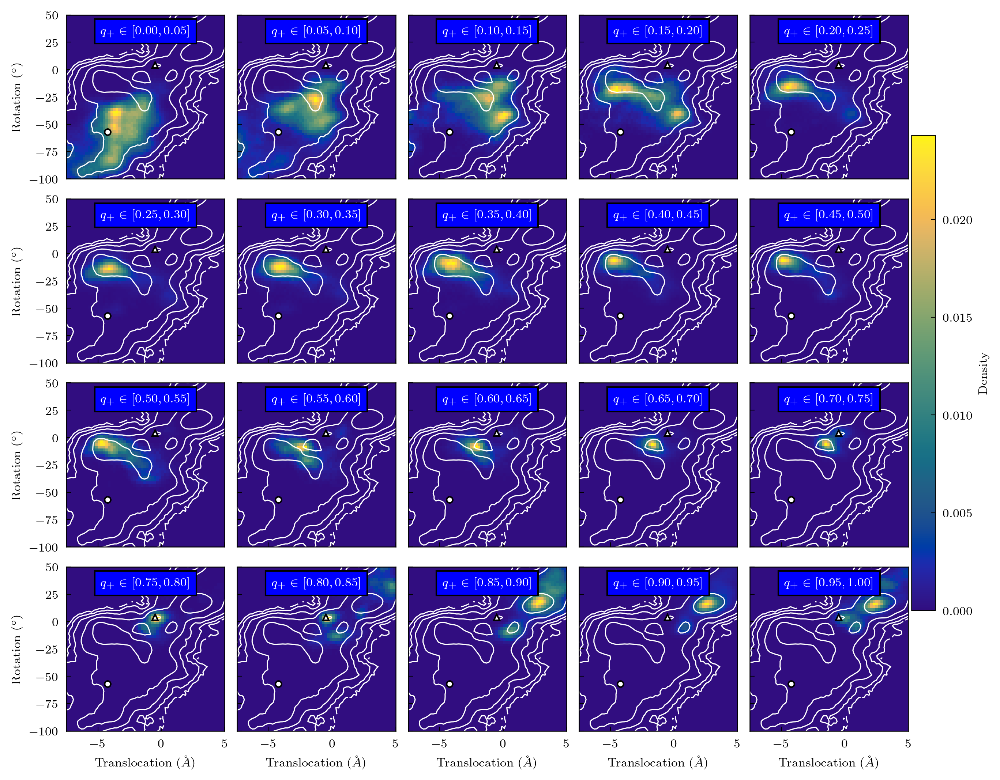

In [240]:
f, axs = plt.subplots(4, 5, figsize=(9, 7), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices, slice_dens):
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    ax.contour(xcent, ycent, diff.T, colors='white', levels=clines)
    plotting.format_cvs(ax, ms=4)
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", ax=ax, c='white', bbox=dict(fc='blue'), transform=ax.transAxes)
    ax.label_outer()
    ax.set(xlim=[-7.5, 5], ylim=[-100, 50])
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("Density")

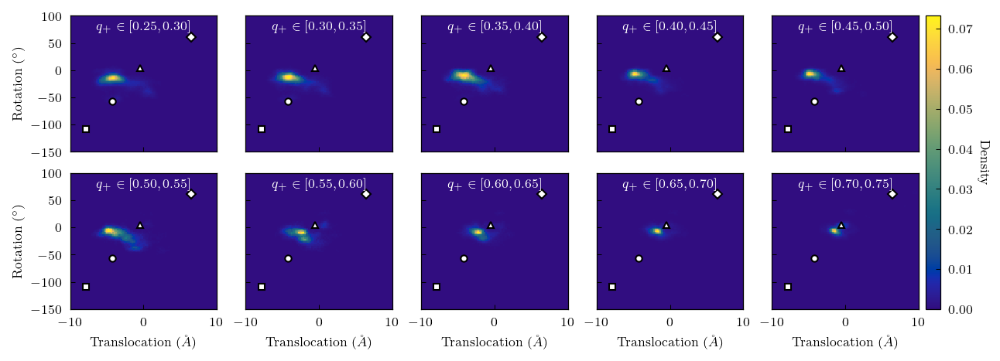

In [241]:
f, axs = plt.subplots(2, 5, figsize=(8.5, 3), sharex=True, sharey=True, constrained_layout=True)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices[5:15], slice_dens[5:15]):
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    plotting.format_cvs(ax, ms=4)
    pplt.text(0, 80, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", ax=ax, c='white')
    ax.label_outer()
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("Density", rotation=-90, labelpad=10)

Inspect structures

In [34]:
np.unravel_index(np.argmax(slice_dens[1]), (200, 200))

(87, 96)

In [36]:
xlim[87], ylim[96]

(-1.299999999999999, -30.0)

In [39]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.05, -1.3, -30), arr, n=10):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(116, 7061) 0.046486812691994936 [ -1.306 -29.996]
(180, 28571) 0.03524049054981497 [ -1.293 -29.988]
71 9295
43 5702
(180, 79124) 0.06721872326542322 [ -1.3   -29.976]
(180, 16244) 0.03849846383178858 [ -1.323 -30.016]
71 9701
(180, 4715) 0.05884321082175223 [ -1.267 -29.996]
(50, 4715) 0.058843210821752256 [ -1.267 -29.996]
(179, 30432) 0.015753669868413755 [ -1.302 -29.993]


## Salt bridges to D129

In [64]:
def q_slice_dens(cv0, cv1, q, w, xmin, xmax, ymin, ymax, nbins, qstep=0.05, low=0, hi=1):
    xlim = np.linspace(xmin, xmax, nbins + 1)
    ylim = np.linspace(ymin, ymax, nbins + 1)
    q_slices = [(i * qstep, (i + 1) * qstep) for i in range(int(np.ceil(1 / 0.05)))]
    slice_ids = []
    slice_dens = []
    q_arr = np.concatenate(q)
    w_arr = np.concatenate(w)
    cv0_arr = np.concatenate(cv0)
    cv1_arr = np.concatenate(cv1)
    for low, hi in q_slices:
        inds = ((q_arr >= low) & (q_arr <= hi)).nonzero()[0]
        slice_ids.append(inds)
        dens, _, _ = np.histogram2d(
            cv0_arr[inds],
            cv1_arr[inds], 
            range=[[xmin, xmax], [ymin, ymax]],
            weights=w_arr[inds], 
            density=True,
            bins=nbins)
        slice_dens.append(dens)
    return xlim, ylim, q_slices, slice_ids, slice_dens

In [68]:
sb0, sb1 = sb_ids[0], sb_ids[1]
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
xlim, ylim, q_slices, slice_ids, slice_dens = q_slice_dens(sb0_trajs, sb1_trajs, qp_du, weights[0], 3, 12, 7, 22, 100)

In [69]:
pmf_sb = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
xcent = (xlim[1:] + xlim[:-1]) / 2
ycent = (ylim[1:] + ylim[:-1]) / 2
offset = np.min(-np.log(pmf_sb[np.nonzero(pmf_sb)]))
diff = (-np.log(pmf_sb) - offset) * 0.593 
clines = np.linspace(0, 6, 7)

/scratch/local/jobs/3862660/ipykernel_3830996/2351228838.py:5: RuntimeWarning: divide by zero encountered in log
  diff = (-np.log(pmf_sb) - offset) * 0.593


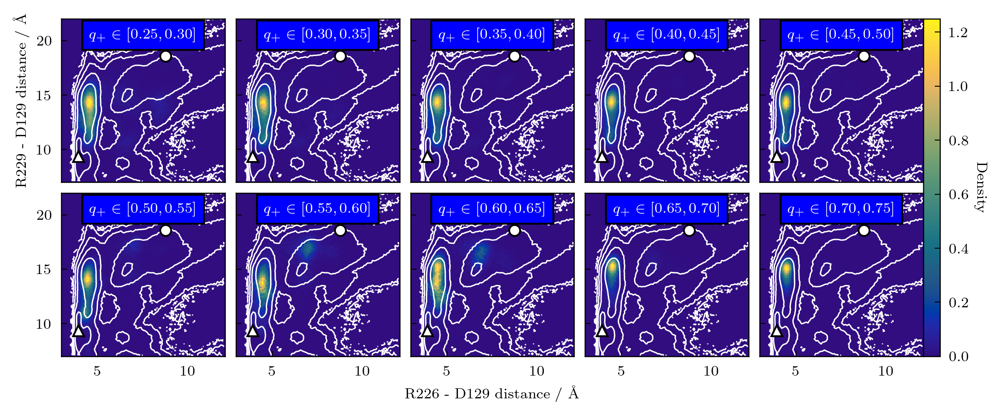

In [71]:
f, axs = plt.subplots(2, 5, figsize=(7.5, 3), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices[5:15], slice_dens[5:15]):
    ax.contour(xcent, ycent, diff.T, colors='white', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", ax=ax, c='white', bbox=dict(fc='blue'), transform=ax.transAxes)
    plotting.plot_single_model(ax, sb_models[1, [sb0, sb1]] * 10, 'd', ms=6)
    plotting.plot_single_model(ax, sb_models[2, [sb0, sb1]] * 10, 'u', ms=6)
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("Density", rotation=-90, labelpad=10)

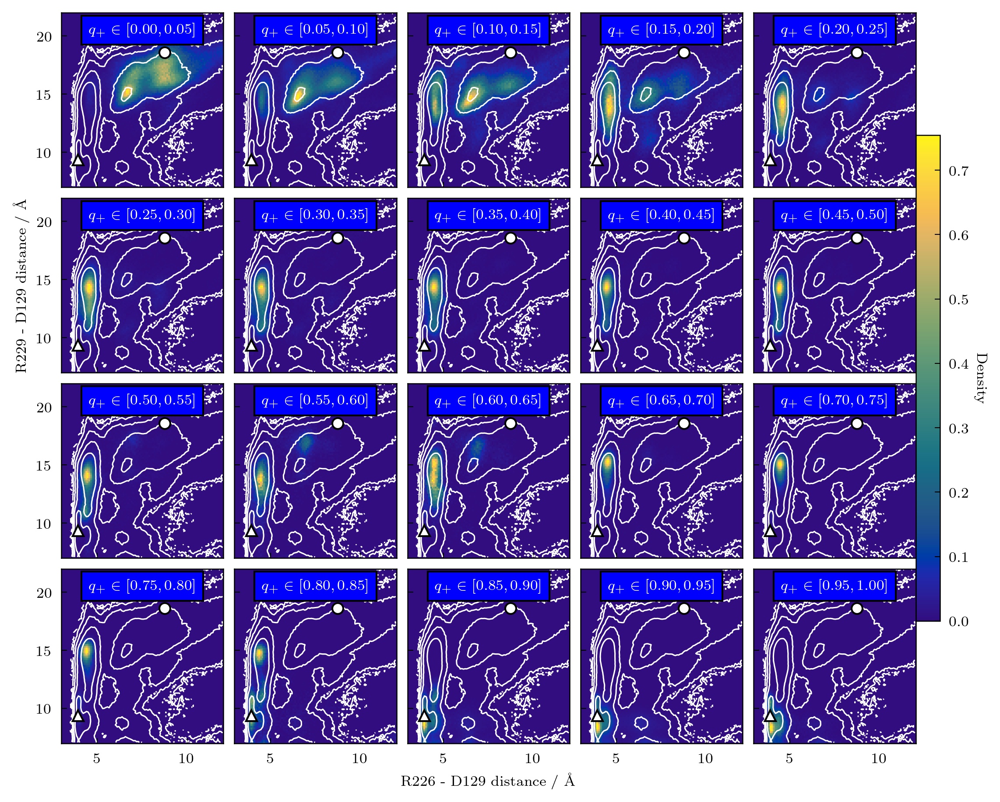

In [73]:
f, axs = plt.subplots(4, 5, figsize=(7.5, 6), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices, slice_dens):
    ax.contour(xcent, ycent, diff.T, colors='white', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", ax=ax, c='white', bbox=dict(fc='blue'), transform=ax.transAxes)
    plotting.plot_single_model(ax, sb_models[1, [sb0, sb1]] * 10, 'd', ms=6)
    plotting.plot_single_model(ax, sb_models[2, [sb0, sb1]] * 10, 'u', ms=6)
axs[-1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("Density", rotation=-90, labelpad=10)

## Distances to D186

In [74]:
sb0, sb1 = sb_ids[2], sb_ids[3]
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
xlim, ylim, q_slices, slice_ids, slice_dens = q_slice_dens(sb0_trajs, sb1_trajs, qp_du, weights[0], 3, 15, 3, 12, 100)

In [75]:
pmf_sb = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
xcent = (xlim[1:] + xlim[:-1]) / 2
ycent = (ylim[1:] + ylim[:-1]) / 2
offset = np.min(-np.log(pmf_sb[np.nonzero(pmf_sb)]))
diff = (-np.log(pmf_sb) - offset) * 0.593 
clines = np.linspace(0, 5, 6)

/scratch/local/jobs/3862660/ipykernel_3830996/1722330574.py:5: RuntimeWarning: divide by zero encountered in log
  diff = (-np.log(pmf_sb) - offset) * 0.593


In [60]:
importlib.reload(plotting)

<module 'plotting' from '/project/dinner/scguo/ci-vsd/notebooks/anton2/../../python/plotting.py'>

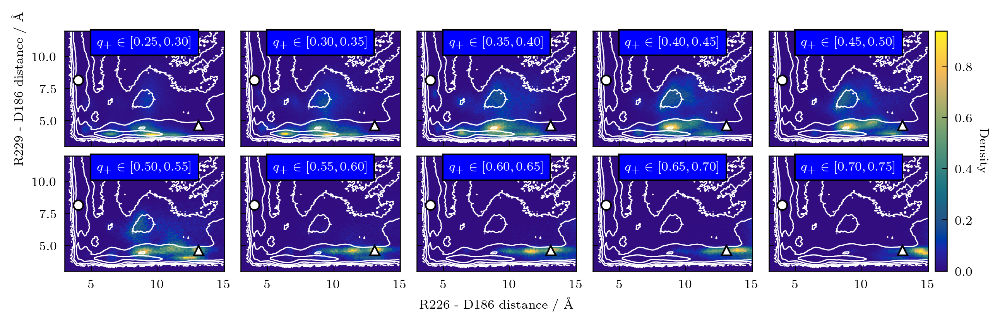

In [ ]:
f, axs = plt.subplots(2, 5, figsize=(8.5, 2.5), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices[5:15], slice_dens[5:15]):
    ax.contour(xcent, ycent, diff.T, colors='white', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", ax=ax, c='white', bbox=dict(fc='blue'), transform=ax.transAxes)
    plotting.plot_single_model(ax, sb_models[1, [sb0, sb1]] * 10, 'd', ms=6)
    plotting.plot_single_model(ax, sb_models[2, [sb0, sb1]] * 10, 'u', ms=6)
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("Density", rotation=-90, labelpad=10)

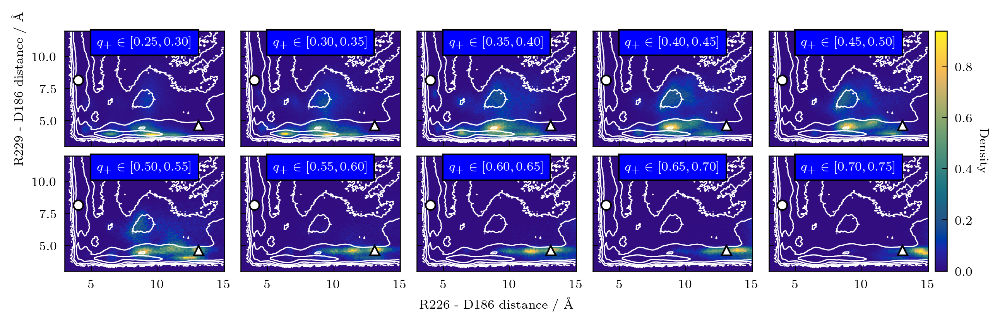

In [79]:
f, axs = plt.subplots(2, 5, figsize=(8.5, 2.5), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices[5:15], slice_dens[5:15]):
    ax.contour(xcent, ycent, diff.T, colors='white', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", ax=ax, c='white', bbox=dict(fc='blue'), transform=ax.transAxes)
    plotting.plot_single_model(ax, sb_models[1, [sb0, sb1]] * 10, 'd', ms=6)
    plotting.plot_single_model(ax, sb_models[2, [sb0, sb1]] * 10, 'u', ms=6)
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("Density", rotation=-90, labelpad=10)

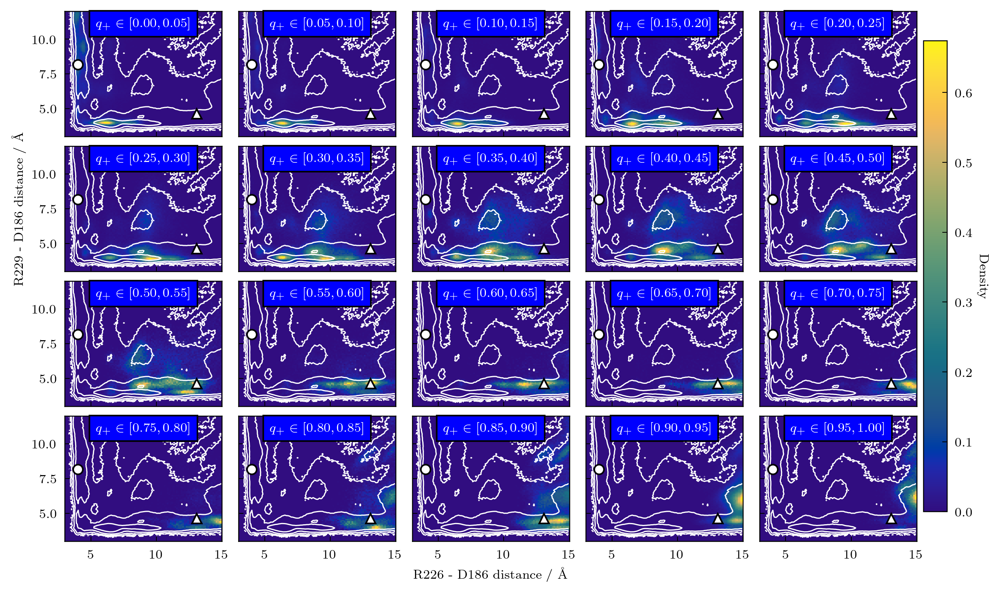

In [80]:
f, axs = plt.subplots(4, 5, figsize=(8.5, 5), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices, slice_dens):
    ax.contour(xcent, ycent, diff.T, colors='white', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", ax=ax, c='white', bbox=dict(fc='blue'), transform=ax.transAxes)
    plotting.plot_single_model(ax, sb_models[1, [sb0, sb1]] * 10, 'd', ms=6)
    plotting.plot_single_model(ax, sb_models[2, [sb0, sb1]] * 10, 'u', ms=6)
axs[-1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("Density", rotation=-90, labelpad=10)

# Reactive density

In [96]:
def q_slice_reactive_dens(cv0, cv1, qp, qm, w, xmin, xmax, ymin, ymax, nbins, qstep=0.05, low=0, hi=1):
    xlim = np.linspace(xmin, xmax, nbins + 1)
    ylim = np.linspace(ymin, ymax, nbins + 1)
    q_slices = [(i * qstep, (i + 1) * qstep) for i in range(int(np.ceil(1 / 0.05)))]
    slice_ids = []
    slice_dens = []
    qp_arr = np.concatenate(qp)
    qm_arr = np.concatenate(qm)
    w_arr = np.concatenate(w)
    cv0_arr = np.concatenate(cv0)
    cv1_arr = np.concatenate(cv1)
    for low, hi in q_slices:
        inds = ((qp_arr >= low) & (qp_arr <= hi)).nonzero()[0]
        slice_ids.append(inds)
        reac_dens, _, _ = np.histogram2d(
            cv0_arr[inds],
            cv1_arr[inds], 
            range=[[xmin, xmax], [ymin, ymax]],
            weights=qp_arr[inds] * qm_arr[inds] * w_arr[inds], 
            density=True,
            bins=nbins)
        dens, _, _ = np.histogram2d(
            cv0_arr[inds],
            cv1_arr[inds], 
            range=[[xmin, xmax], [ymin, ymax]],
            weights=w_arr[inds], 
            density=True,
            bins=nbins)
        slice_dens.append(reac_dens / dens)
    return xlim, ylim, q_slices, slice_ids, slice_dens

In [116]:
sb0, sb1 = sb_ids[0], sb_ids[1]
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
xlim, ylim, q_slices, slice_ids, slice_dens = q_slice_reactive_dens(sb0_trajs, sb1_trajs, qp_du, qm_du, weights[0], 3, 12, 7, 22, 100)

/scratch/local/jobs/3862660/ipykernel_3830996/2866985093.py:29: RuntimeWarning: invalid value encountered in true_divide
  slice_dens.append(reac_dens / dens)


In [99]:
pmf_sb = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
xcent = (xlim[1:] + xlim[:-1]) / 2
ycent = (ylim[1:] + ylim[:-1]) / 2
offset = np.min(-np.log(pmf_sb[np.nonzero(pmf_sb)]))
diff = (-np.log(pmf_sb) - offset) * 0.593 
clines = np.linspace(0, 6, 7)

/scratch/local/jobs/3862660/ipykernel_3830996/2351228838.py:5: RuntimeWarning: divide by zero encountered in log
  diff = (-np.log(pmf_sb) - offset) * 0.593


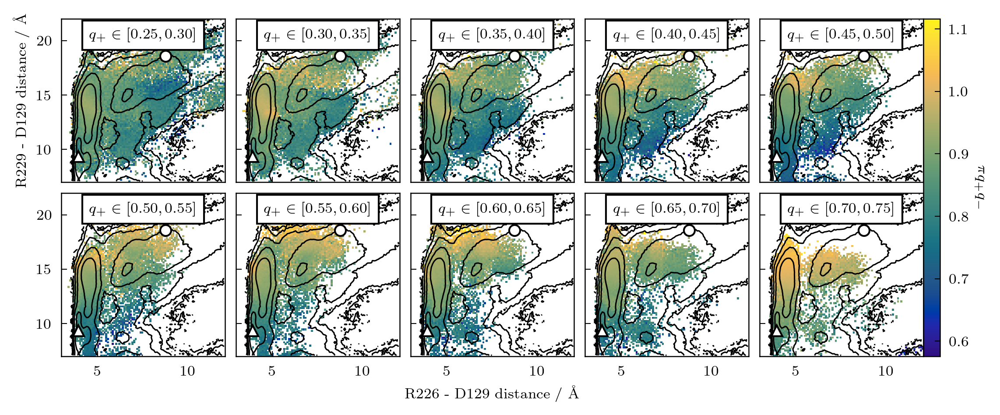

In [105]:
f, axs = plt.subplots(2, 5, figsize=(7.5, 3), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices[5:15], slice_dens[5:15]):
    ax.contour(xcent, ycent, diff.T, colors='black', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", 
        ax=ax, c='black', bbox={'fc': 'white', 'ec': None}, transform=ax.transAxes)
    plotting.plot_single_model(ax, sb_models[1, [sb0, sb1]] * 10, 'd', ms=6)
    plotting.plot_single_model(ax, sb_models[2, [sb0, sb1]] * 10, 'u', ms=6)
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("$\\pi q_+ q_-$", rotation=-90, labelpad=10)

In [159]:
arr = np.vstack((q_arr, sb_arr[:, 42], sb_arr[:, 48])).T
for i in util.find_closest_points((0.3, 0.5, 1.7), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(20, 7195) 0.2980006126401986 [ 1.5000e-02 -3.9749e+01]
(202, 8268) 0.29836336733645097 [-5.385 -8.08 ]
(20, 6321) 0.2908239980940228 [  0.153 -50.44 ]
(20, 4822) 0.29570113870301296 [  0.335 -39.776]
3 5607


In [160]:
arr = np.vstack((q_arr, sb_arr[:, 42], sb_arr[:, 48])).T
for i in util.find_closest_points((0.3, 0.5, 1.4), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(182, 34362) 0.30063337949440216 [ -3.904 -10.114]
(68, 4631) 0.2982513045760447 [-3.36  -7.708]
51 2879
(19, 7742) 0.2996182269866962 [ -1.549 -18.421]
9 9591


In [129]:
arr = np.vstack((q_arr, sb_arr[:, 42], sb_arr[:, 48])).T
for i in util.find_closest_points((0.3, 0.7, 1.7), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

40 5377
(22, 4307) 0.29110754041736886 [ -3.64  -30.528]
40 6185
(22, 8805) 0.2942748844684815 [ -2.142 -26.191]
(22, 6860) 0.31066255573331686 [ -2.732 -30.45 ]


In [161]:
arr = np.vstack((q_arr, sb_arr[:, 42], sb_arr[:, 48])).T
for i in util.find_closest_points((0.5, 0.6, 1.6), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

106 2945
106 9779
106 9706
110 9485
106 9761


In [162]:
arr = np.vstack((q_arr, sb_arr[:, 42], sb_arr[:, 48])).T
for i in util.find_closest_points((0.5, 0.55, 1.6), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

106 8232
110 9530
106 7654
106 5199
106 8489


In [163]:
arr = np.vstack((q_arr, sb_arr[:, 42], sb_arr[:, 48])).T
for i in util.find_closest_points((0.5, 0.5, 1.7), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

106 5787
20 5888
106 5777
106 6310
106 9090


In [164]:
arr = np.vstack((q_arr, sb_arr[:, 42], sb_arr[:, 48])).T
for i in util.find_closest_points((0.7, 0.5, 1.7), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(257, 155) 0.6960283376514396 [ -1.377 -12.761]
(196, 2732) 0.7030599215051786 [-0.279  4.692]
(196, 4978) 0.6869071460033667 [0.378 8.318]
81 9475
20 5007


In [165]:
arr = np.vstack((q_arr, sb_arr[:, 42], sb_arr[:, 48])).T
for i in util.find_closest_points((0.7, 0.7, 1.5), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(216, 8609) 0.6990726684466333 [ -0.21  -14.915]
(257, 6361) 0.6974287600916208 [  0.983 -12.459]
20 1663
20 1904
20 9155


In [165]:
arr = np.vstack((q_arr, sb_arr[:, 42], sb_arr[:, 48])).T
for i in util.find_closest_points((0.7, 0.7, 1.5), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(216, 8609) 0.6990726684466333 [ -0.21  -14.915]
(257, 6361) 0.6974287600916208 [  0.983 -12.459]
20 1663
20 1904
20 9155


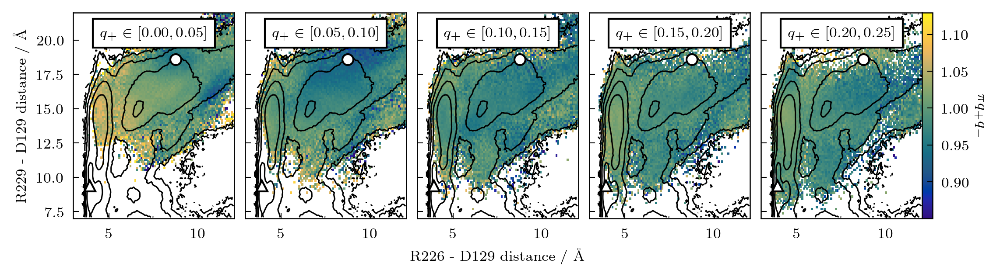

In [109]:
f, axs = plt.subplots(1, 5, figsize=(7.5, 2), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices[:5], slice_dens[:5]):
    ax.contour(xcent, ycent, diff.T, colors='black', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", 
        ax=ax, c='black', bbox={'fc': 'white', 'ec': None}, transform=ax.transAxes)
    plotting.plot_single_model(ax, sb_models[1, [sb0, sb1]] * 10, 'd', ms=6)
    plotting.plot_single_model(ax, sb_models[2, [sb0, sb1]] * 10, 'u', ms=6)
axs[2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[-1], pad=0)
cb.set_label("$\\pi q_+ q_-$", rotation=-90, labelpad=10)

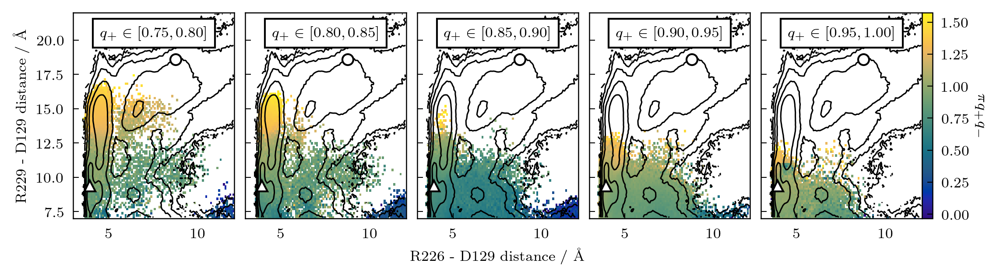

In [111]:
f, axs = plt.subplots(1, 5, figsize=(7.5, 2), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices[-5:], slice_dens[-5:]):
    ax.contour(xcent, ycent, diff.T, colors='black', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", 
        ax=ax, c='black', bbox={'fc': 'white', 'ec': None}, transform=ax.transAxes)
    plotting.plot_single_model(ax, sb_models[1, [sb0, sb1]] * 10, 'd', ms=6)
    plotting.plot_single_model(ax, sb_models[2, [sb0, sb1]] * 10, 'u', ms=6)
axs[2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[-1], pad=0)
cb.set_label("$\\pi q_+ q_-$", rotation=-90, labelpad=10)

## to 186

In [166]:
sb0, sb1 = sb_ids[2], sb_ids[3]
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
xlim, ylim, q_slices, slice_ids, slice_dens = q_slice_reactive_dens(sb0_trajs, sb1_trajs, qp_du, qm_du, weights[0], 3, 15, 3, 12, 100)

/scratch/local/jobs/3862660/ipykernel_3830996/2866985093.py:29: RuntimeWarning: invalid value encountered in true_divide
  slice_dens.append(reac_dens / dens)


In [167]:
pmf_sb = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
xcent = (xlim[1:] + xlim[:-1]) / 2
ycent = (ylim[1:] + ylim[:-1]) / 2
offset = np.min(-np.log(pmf_sb[np.nonzero(pmf_sb)]))
diff = (-np.log(pmf_sb) - offset) * 0.593 
clines = np.linspace(0, 5, 6)

/scratch/local/jobs/3862660/ipykernel_3830996/1722330574.py:5: RuntimeWarning: divide by zero encountered in log
  diff = (-np.log(pmf_sb) - offset) * 0.593


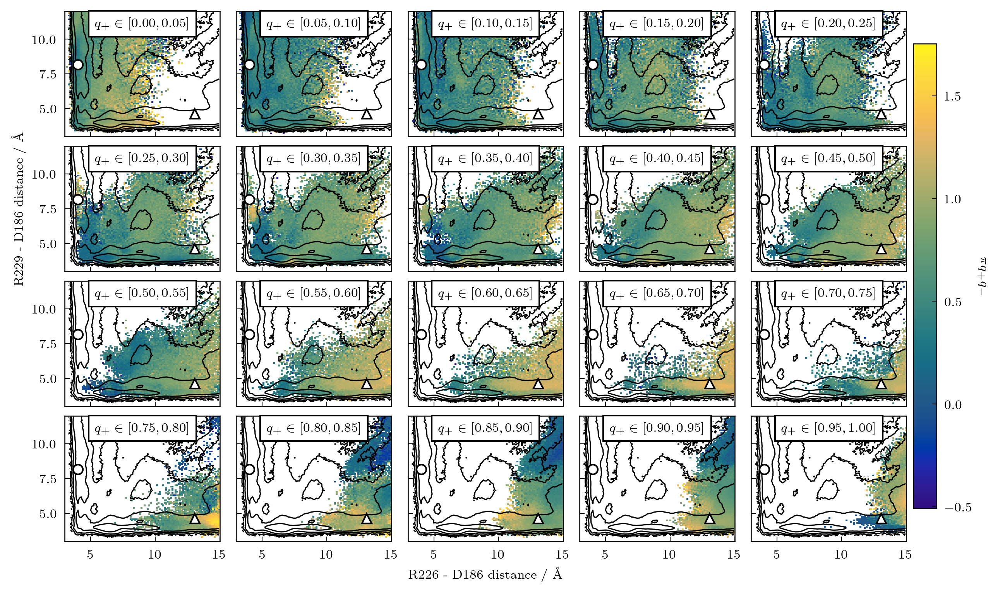

In [115]:
f, axs = plt.subplots(4, 5, figsize=(8.5, 5), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices, slice_dens):
    ax.contour(xcent, ycent, diff.T, colors='black', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", 
        ax=ax, c='black', bbox={'fc': 'white', 'ec': None}, transform=ax.transAxes)
    plotting.plot_single_model(ax, sb_models[1, [sb0, sb1]] * 10, 'd', ms=6)
    plotting.plot_single_model(ax, sb_models[2, [sb0, sb1]] * 10, 'u', ms=6)
axs[-1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("$\\pi q_+ q_-$", rotation=-90, labelpad=10)

In [169]:
arr = np.vstack((q_arr, sb_arr[:, 47], sb_arr[:, 53])).T
for i in util.find_closest_points((0.05, 0.9, 0.35), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(18, 8287) 0.03512201885122296 [ -1.489 -22.355]
(112, 2046) 0.06772801700153117 [ -4.614 -44.723]
(18, 8285) 0.0603953337213991 [ -1.89 -24.35]
43 8268
(204, 9870) 0.05747284616574966 [ -2.985 -35.983]


In [171]:
arr = np.vstack((q_arr, sb_arr[:, 47], sb_arr[:, 53])).T
for i in util.find_closest_points((0.3, 0.4, 0.7), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

103 6424
103 6489
103 6496
103 6488
(210, 1657) 0.2988796112640969 [-6.301 -9.795]


In [172]:
arr = np.vstack((q_arr, sb_arr[:, 47], sb_arr[:, 53])).T
for i in util.find_closest_points((0.3, 0.75, 0.35), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(71, 5931) 0.3032205549680649 [ -2.769 -13.436]
(15, 4162) 0.29342428293707135 [ -3.328 -16.751]
(71, 5846) 0.30381569382883955 [ -3.027 -14.782]
(71, 6503) 0.29052665137347805 [ -2.791 -11.375]
(68, 2373) 0.29809056827190794 [ -2.854 -18.429]


In [174]:
arr = np.vstack((q_arr, sb_arr[:, 47], sb_arr[:, 53])).T
for i in util.find_closest_points((0.5, 0.85, 0.35), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(15, 3569) 0.4956715108699321 [ -2.296 -13.498]
22 5687
36 5234
22 5939
23 2551


In [175]:
arr = np.vstack((q_arr, sb_arr[:, 47], sb_arr[:, 53])).T
for i in util.find_closest_points((0.5, 1.3, 0.35), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

110 8077
105 5409
106 3972
110 4387
106 4631


In [176]:
arr = np.vstack((q_arr, sb_arr[:, 47], sb_arr[:, 53])).T
for i in util.find_closest_points((0.7, 1.3, 0.45), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(257, 8716) 0.6984759145893382 [ -0.217 -17.376]
(257, 5526) 0.6988415962597502 [ 0.179 -8.931]
(70, 8217) 0.7021556460380126 [-1.224  0.401]
20 1636
(76, 4817) 0.6997244161398488 [-1.039 -5.121]


In [178]:
arr = np.vstack((q_arr, sb_arr[:, 47], sb_arr[:, 53])).T
for i in util.find_closest_points((0.7, 1.2, 0.45), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

82 3686
(70, 5337) 0.7018805974320595 [-1.443 -6.588]
(257, 5851) 0.702181626697808 [ 0.713 -9.799]
(70, 6089) 0.7027271217384277 [-2.054 -3.6  ]
(70, 4069) 0.7013164656985483 [-2.06  -3.379]


## S4 helix

In [231]:
dist_trajs = [t[:, 0] for t in cv_trajs]
rot_trajs = [t[:, 1] for t in cv_trajs]
xmin, xmax, ymin, ymax = -10, 10, -150, 100
xlim, ylim, q_slices, slice_ids, slice_dens = q_slice_reactive_dens(dist_trajs, rot_trajs, qp_du, qm_du, weights[0], xmin, xmax, ymin, ymax, 100)

/scratch/local/jobs/3862660/ipykernel_3830996/2866985093.py:29: RuntimeWarning: invalid value encountered in true_divide
  slice_dens.append(reac_dens / dens)


In [232]:
pmf = extq.projection.density2d(dist_trajs, rot_trajs, weights[0], xlim, ylim)
xcent = (xlim[1:] + xlim[:-1]) / 2
ycent = (ylim[1:] + ylim[:-1]) / 2
offset = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = (-np.log(pmf) - offset) * 0.593 
clines = np.linspace(0, 6, 7)

/scratch/local/jobs/3862660/ipykernel_3830996/1034820469.py:5: RuntimeWarning: divide by zero encountered in log
  diff = (-np.log(pmf) - offset) * 0.593


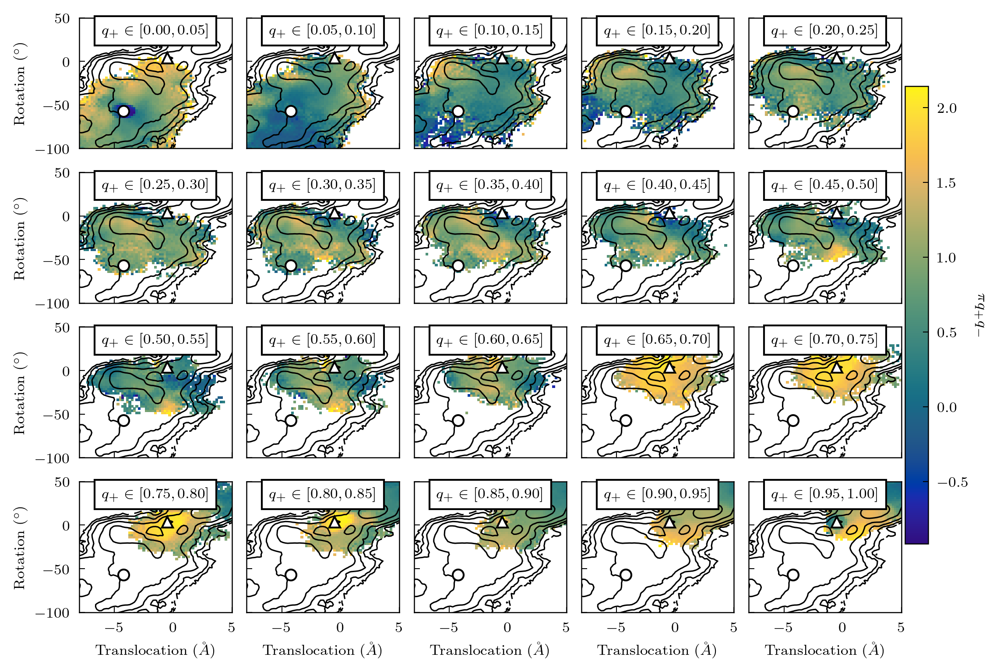

In [235]:
f, axs = plt.subplots(4, 5, figsize=(7.5, 5), sharex=True, sharey=True, constrained_layout=True, dpi=300)
for (ax, (low, hi), dens) in zip(axs.flat, q_slices, slice_dens):
    ax.contour(xcent, ycent, diff.T, colors='black', levels=clines)
    pc = ax.pcolor(xlim, ylim, dens.T, cmap='macaw')
    pplt.text(0.5, 0.9, f"$q_+ \in [{low:.2f}, {hi:.2f}]$", 
        ax=ax, c='black', bbox={'fc': 'white', 'ec': None}, transform=ax.transAxes)
    plotting.format_cvs(ax, ms=6)
    ax.label_outer()
    ax.set(xlim=[-8, 5], ylim=[-100, 50])
cb = plt.colorbar(pc, ax=axs[:, -1], pad=0)
cb.set_label("$\\pi q_+ q_-$", rotation=-90, labelpad=10)

In [236]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.05, -3, -25), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

35 2589
(22, 270) 0.0791215472841515 [ -2.993 -24.977]
56 9619
111 7927
71 6601


In [242]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.05, 0, -25), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(171, 8556) 0.0699604406080332 [ 1.000e-02 -2.502e+01]
(112, 9981) 0.08634594120263508 [  0.    -24.986]
(116, 3954) 0.0933550669578544 [-2.1000e-02 -2.4983e+01]
(50, 5045) 0.07819853394903703 [-2.4000e-02 -2.4957e+01]
(180, 5045) 0.07819853394903732 [-2.4000e-02 -2.4957e+01]


In [243]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.15, 0, -30), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(180, 26556) 0.11651570210793923 [ -0.033 -30.021]
(55, 5516) 0.1893692433351929 [ -0.037 -29.988]
23 7961
18 931
(180, 19291) 0.12143670528868547 [  0.039 -29.968]


In [244]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.3, -4.5, -10), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(182, 81065) 0.2985107811880293 [ -4.502 -10.012]
(182, 83351) 0.3061090634156035 [ -4.516 -10.007]
(210, 9386) 0.2921285517446733 [ -4.49  -10.016]
(230, 4962) 0.3208401379199599 [ -4.501 -10.   ]
7 2369


In [245]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.3, -1, -80), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

8 7486
11 8811
106 2041
59 6324
11 7770


In [246]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.5, 0, -45), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

40 915
106 3207
106 2985
106 2950
(118, 8122) 0.2981768842291416 [ 3.8000e-02 -4.4985e+01]


In [247]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.5, -4.5, -10), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(281, 9321) 0.495262874320335 [ -4.507 -10.009]
102 3695
39 9442
47 2442
(244, 9944) 0.49811008235437304 [-4.509 -9.966]


In [248]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.7, -1, -10), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

61 5067
(181, 53808) 0.7095200514992813 [-0.998 -9.987]
(181, 59667) 0.7023123433654376 [ -1.01  -10.013]
74 5748
(257, 1476) 0.721923082950264 [ -1.016 -10.006]


In [249]:
arr = np.hstack((q_arr[:, None], cv_arr))
for i in util.find_closest_points((0.7, -2, -5), arr, n=5):
    if i < 3_000_000:
        print(util.anton_frame(i), q_arr[i], cv_arr[i])
    else:
        print((i-3_000_000) // 10001, (i-3_000_000) % 10001)

(181, 66889) 0.6991127759090245 [-2.012 -5.005]
(181, 96431) 0.6950565427532887 [-1.993 -5.013]
(181, 87482) 0.7031875211817951 [-1.994 -4.98 ]
(181, 94743) 0.6795037066560287 [-1.988 -5.006]
(181, 80451) 0.6928308705413969 [-1.988 -5.021]


## R-F161 distances

# Averages/distributions along committor

In [146]:
def avg_std(cv, q, w, qstep=0.05, low=0, hi=1):
    cv_arr = np.concatenate(cv)
    q_arr = np.concatenate(q)
    w_arr = np.concatenate(w)
    nsteps = round((hi - low) / qstep)
    avgs = np.zeros(nsteps)
    stds = np.zeros(nsteps)
    for i, s in enumerate(np.linspace(low, hi - qstep, nsteps)):
        q_inds = ((q_arr >= s) & (q_arr <= s + qstep)).nonzero()[0]
        avgs[i] = np.mean(cv_arr[q_inds] * w_arr[q_inds])
        stds[i] = np.std(cv_arr[q_inds] * w_arr[q_inds])
    return avgs, stds

In [154]:
avg_d, std_d = avg_std(dist_trajs, qp_du, weights[0], qstep=0.02)
avg_r, std_r = avg_std(rot_trajs, qp_du, weights[0], qstep=0.02)

(-60.0, 30.0)

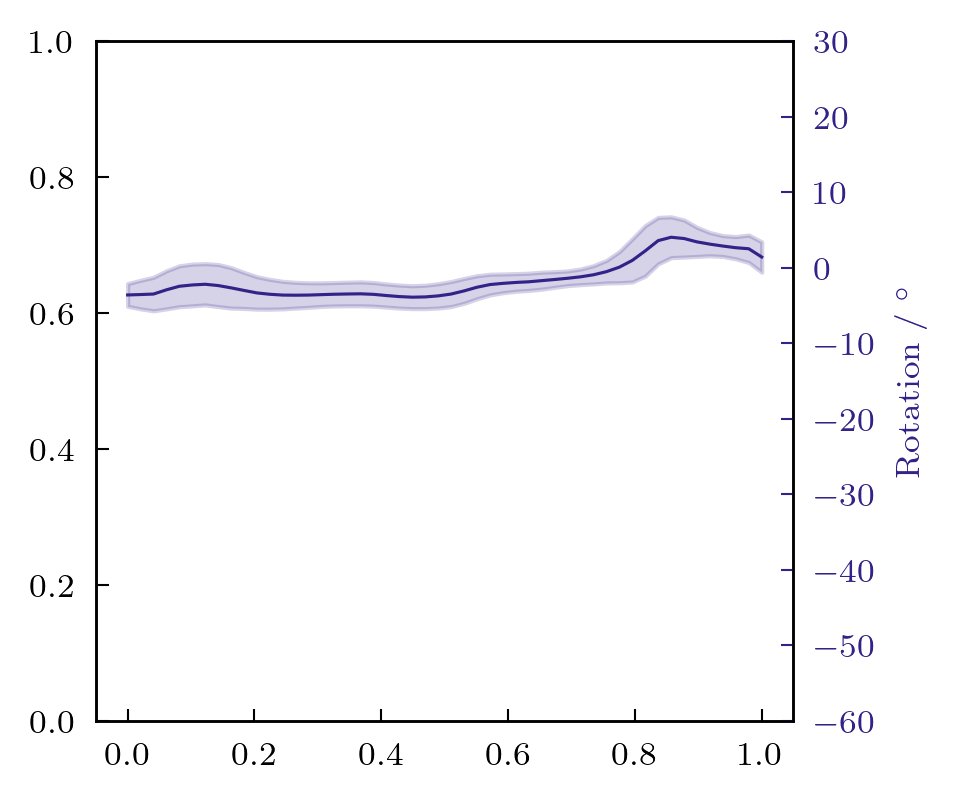

In [155]:
x = np.linspace(0, 1, len(avg_d))
f = plt.figure(dpi=300)
ax = plt.gca()

ax.plot(x, avg_d)
ax.fill_between(x, avg_d - std_d, avg_d + std_d, color='C0', alpha=0.2)
ax.tick_params(axis='y', colors='C0') 
ax.spines['left'].set_color('C0')
ax.set_ylim([-5, 3])

ax2 = ax.twinx()
ax2.plot(x, avg_r, 'C1')
ax2.fill_between(x, avg_r - std_r, avg_r + std_r, color='C1', alpha=0.2)
ax2.set_ylabel("Rotation / $^\circ$")
ax2.yaxis.label.set_color('C1')
ax2.tick_params(axis='y', colors='C1') 
ax2.set_ylim([-60, 30])

In [182]:
def bin_inds(q, qstep=0.05, low=0, hi=1):
    q_arr = np.concatenate(q)
    nsteps = round((hi - low) / qstep)
    all_inds = []
    steps = np.linspace(low, hi - qstep, nsteps)
    for i, s in enumerate(steps):
        q_inds = ((q_arr >= s) & (q_arr <= s + qstep)).nonzero()[0]
        all_inds.append(q_inds)
    return steps, all_inds

In [180]:
import scipy

In [181]:
from scipy.sparse import csr_matrix

def binned_statistic(x, values, func, nbins, range):
    '''The usage is nearly the same as scipy.stats.binned_statistic''' 

    N = len(values)
    r0, r1 = range

    digitized = (float(nbins)/(r1 - r0)*(x - r0)).astype(int)
    S = csr_matrix((values, [digitized, np.arange(N)]), shape=(nbins, N))

    return [func(group) for group in np.split(S.data, S.indptr[1:-1])]

In [187]:
steps, q_inds = bin_inds(qp_du, qstep=0.1, low=0.2, hi=0.8)

In [197]:
import pandas as pd

(-1.0, 6.0)

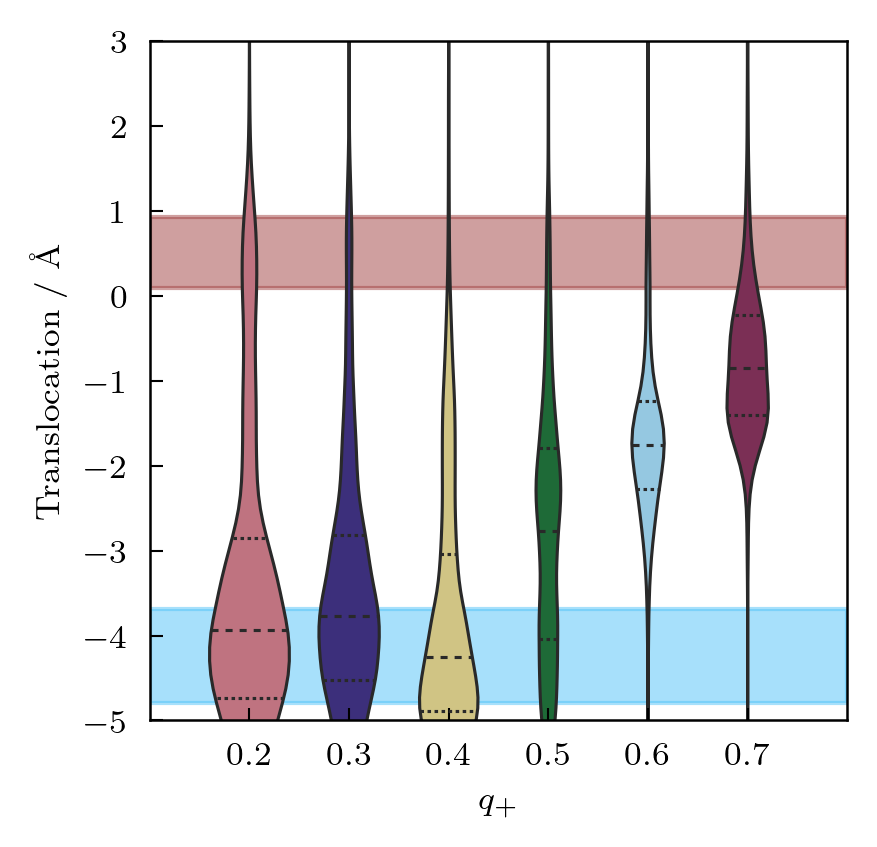

In [224]:
f = plt.figure(dpi=300)
ax = sns.violinplot(data=[cv_arr[inds, 0] for inds in q_inds], scale='count', bw=0.1, inner="quartile")
steplabels = [f"{s:.1f}" for s in steps]
ax.set_xticklabels(steplabels)
ax.set_xlabel("$q_+$")
ax.set_ylabel("Translocation / Å")
ax.set_ylim([-5, 3])
ax.fill_between(np.arange(-1, 7), -4.240 - 0.55, -4.24 + 0.55, color='#51C3F9', alpha=0.5, zorder=0)
ax.fill_between(np.arange(-1, 7), 0.506 - 0.42, 0.506 + 0.42, color='#A14040', alpha=0.5, zorder=0)
ax.set_xlim([-1, 6])

(-1.0, 6.0)

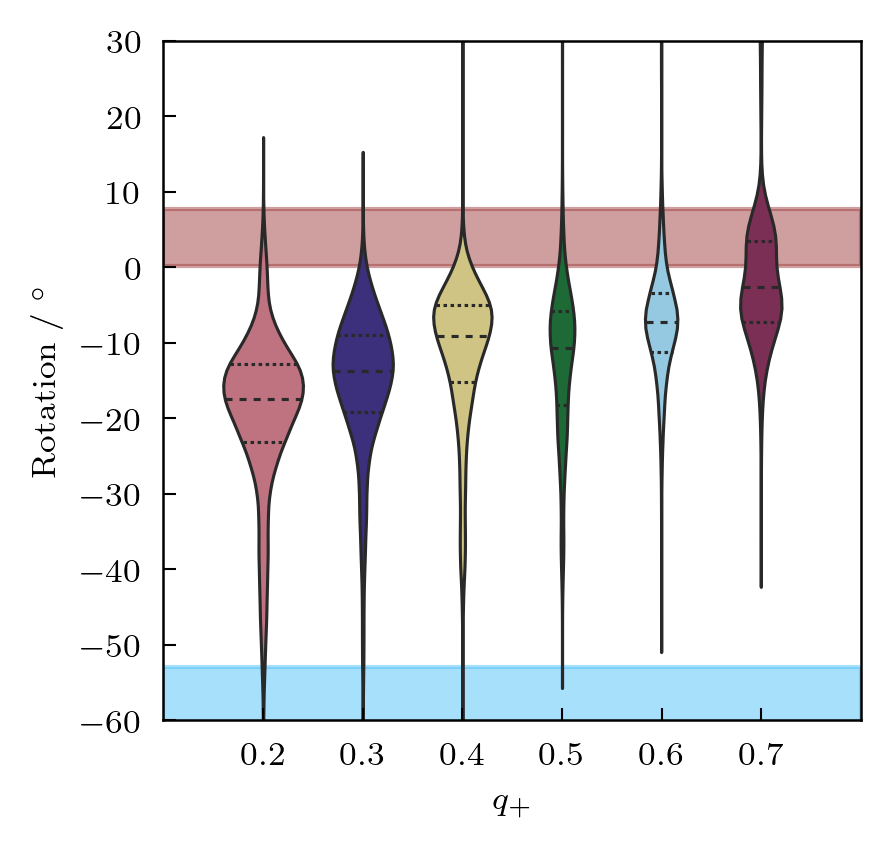

In [225]:
f = plt.figure(dpi=300)
ax = sns.violinplot(data=[cv_arr[inds, 1] for inds in q_inds], scale='count', bw=0.1, inner="quartile")
steplabels = [f"{s:.1f}" for s in steps]
ax.set_xticklabels(steplabels)
ax.set_xlabel("$q_+$")
ax.set_ylabel("Rotation / $^\circ$")
ax.set_ylim([-60, 30])
ax.fill_between(np.arange(-1, 7), -56.95 - 4, -56.95 + 4, color='#51C3F9', alpha=0.5, zorder=0)
ax.fill_between(np.arange(-1, 7), 3.94 - 3.8, 3.94 + 3.8, color='#A14040', alpha=0.5, zorder=0)
ax.set_xlim([-1, 6])